If PDPs aren't consistent across models, we cannot take the relationships they present as physical facts, but rather as anaomolies that rise up due to the data properties and the algorithms use of them for classification. 

This notebook will test whether PD consistency is kept accross a seperate GBC model with unique parameters. One of the methods tested is the hyperopt-sklearn hyperoptimization library, claiming to provide a result to the problem of finding optimised models and parameter values for given data. 

In [1]:
import pandas as pd
import numpy as np
from sklearn import cross_validation, metrics   
import matplotlib.pyplot as plt
from IPython.core.display import display, HTML
import operator 
import xgboost as xgb
from xgboost.sklearn import XGBClassifier 
display(HTML("<style>.container { width:100% !important; }</style>"))
%matplotlib inline
trainData = pd.read_csv('1e7data_train.csv', index_col=0)
testData = pd.read_csv('1e7data_holdout.csv', index_col=0)
df = trainData
dftest = testData

feature_names = ['daOverRH1', 'daOverRH2', 'mindaOverRH', 'maxdaOverRH','norm_std_a1',
                 'norm_max_a1', 'norm_std_window10_a1', 'norm_max_window10_a1',
                'norm_std_a2', 'norm_std_window10_a2', 'norm_max_window10_a2', 'norm_max_a2',
                'norm_std_a3', 'norm_max_a3', 'norm_std_window10_a3', 'norm_max_window10_a3', 
                'avg_ecross1', 'std_ecross1', 'min_ecross1', 'max_ecross1', 
                'avg_ecross2', 'std_ecross2', 'max_ecross2', 'min_ecross2',
                'avg_ecross3', 'max_ecross3', 'min_ecross3', 'std_ecross3', 
                'norm_a1_slope', 'norm_a2_slope', 'norm_a3_slope', 'norm_LyapunovTime']

X_train = df[feature_names]


y_train = df['Stable']
y_test = dftest['Stable']

X_test = dftest[feature_names]

X_train = X_train.replace(np.nan, -999)
X_train = X_train.replace(np.inf, -999)

X_test = X_test.replace(np.nan, -999)
X_test = X_test.replace(np.inf, -999)



/home/tom/anaconda2/envs/py27/lib/python2.7/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [5]:
# Using hyperopt

{'x': 0.0001624013423371898}


In [26]:
from hpsklearn import HyperoptEstimator
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from sklearn.model_selection import cross_val_score

from sklearn.ensemble import GradientBoostingClassifier

def hyperopt_train_test(params):
    clf = GradientBoostingClassifier(**params)
    return cross_val_score(clf, X_train, y_train, cv=4, scoring='roc_auc').mean()


space4gbc = {
    'max_depth': hp.choice('max_depth', range(1,20)),
    'max_features': hp.choice('max_features', range(1,5)),
}

best = 0
def f(params):
    global best
    acc = hyperopt_train_test(params)
    if acc > best:
        best = acc
        print 'new best:', best, params
    return {'loss': -acc, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4gbc, algo=tpe.suggest, max_evals=300, trials=trials)
print 'best:'
print best

new best: 0.937735295299 {'max_features': 2, 'max_depth': 2}
new best: 0.946701813553 {'max_features': 1, 'max_depth': 11}
new best: 0.9469943381 {'max_features': 1, 'max_depth': 11}
new best: 0.948495921464 {'max_features': 3, 'max_depth': 15}
new best: 0.94957451267 {'max_features': 3, 'max_depth': 5}
new best: 0.95056015824 {'max_features': 4, 'max_depth': 6}
new best: 0.950964115355 {'max_features': 3, 'max_depth': 10}
new best: 0.951365826964 {'max_features': 4, 'max_depth': 12}
new best: 0.95137642843 {'max_features': 4, 'max_depth': 9}
new best: 0.951575942913 {'max_features': 4, 'max_depth': 9}
new best: 0.951935933764 {'max_features': 4, 'max_depth': 9}
best:
{'max_features': 3, 'max_depth': 8}


In [29]:
space4gbc = {
    'max_depth': hp.choice('max_depth', range(1,20)),
    'max_features': hp.choice('max_features', range(1,5)),
    'learning_rate': hp.choice('learning_rate', (.1, .01, .001)),
    'max_leaf_nodes': hp.choice('max_leaf_nodes', range(2, 10)),
    'n_estimators': hp.choice('n_estimators', range(100, 10000, 100))
    
}

best = 0
def f(params):
    global best
    acc = hyperopt_train_test(params)
    if acc > best:
        best = acc
        print 'new best:', best, params
    return {'loss': -acc, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4gbc, algo=tpe.suggest, max_evals=300, trials=trials)
print 'best:'
print best

new best: 0.937326625012 {'max_features': 2, 'max_leaf_nodes': 6, 'learning_rate': 0.001, 'n_estimators': 3600, 'max_depth': 2}
new best: 0.950235569236 {'max_features': 3, 'max_leaf_nodes': 5, 'learning_rate': 0.01, 'n_estimators': 5900, 'max_depth': 4}
new best: 0.950713055701 {'max_features': 2, 'max_leaf_nodes': 8, 'learning_rate': 0.1, 'n_estimators': 9700, 'max_depth': 14}
new best: 0.951425297366 {'max_features': 3, 'max_leaf_nodes': 8, 'learning_rate': 0.1, 'n_estimators': 8100, 'max_depth': 8}
new best: 0.951789855103 {'max_features': 3, 'max_leaf_nodes': 9, 'learning_rate': 0.01, 'n_estimators': 7600, 'max_depth': 7}
new best: 0.951842852354 {'max_features': 4, 'max_leaf_nodes': 9, 'learning_rate': 0.1, 'n_estimators': 8700, 'max_depth': 8}
new best: 0.952137379309 {'max_features': 4, 'max_leaf_nodes': 9, 'learning_rate': 0.1, 'n_estimators': 8700, 'max_depth': 9}
new best: 0.952527189543 {'max_features': 4, 'max_leaf_nodes': 9, 'learning_rate': 0.1, 'n_estimators': 8700, 'ma

In [31]:
space4gbc = {
    'max_depth': hp.choice('max_depth', range(1,20)),
    'max_features': hp.choice('max_features', range(7,20,2)),
    'learning_rate': hp.choice('learning_rate', (.1, .01, .001)),
    'max_leaf_nodes': hp.choice('max_leaf_nodes', range(2, 10)),
    'n_estimators': hp.choice('n_estimators', range(100, 10000, 100)),
    'min_samples_split': hp.choice('min_samples_split', range(200,1001,200)),
    'subsample': hp.choice('subsample', [0.6,0.7,0.75,0.8,0.85,0.9])
    
    
}

best = 0
def f(params):
    global best
    acc = hyperopt_train_test(params)
    if acc > best:
        best = acc
        print 'new best:', best, params
    return {'loss': -acc, 'status': STATUS_OK}

trials = Trials()
best = fmin(f, space4gbc, algo=tpe.suggest, max_evals=300, trials=trials)
print 'best:'
print best

new best: 0.942705588343 {'n_estimators': 6900, 'subsample': 0.85, 'max_features': 13, 'min_samples_split': 800, 'max_leaf_nodes': 2, 'learning_rate': 0.01, 'max_depth': 4}
new best: 0.94767657789 {'n_estimators': 6400, 'subsample': 0.8, 'max_features': 19, 'min_samples_split': 1000, 'max_leaf_nodes': 8, 'learning_rate': 0.01, 'max_depth': 3}
new best: 0.948416063358 {'n_estimators': 5000, 'subsample': 0.8, 'max_features': 15, 'min_samples_split': 800, 'max_leaf_nodes': 9, 'learning_rate': 0.01, 'max_depth': 6}
new best: 0.951400256969 {'n_estimators': 6300, 'subsample': 0.8, 'max_features': 9, 'min_samples_split': 200, 'max_leaf_nodes': 9, 'learning_rate': 0.01, 'max_depth': 15}
new best: 0.951562077137 {'n_estimators': 2300, 'subsample': 0.8, 'max_features': 9, 'min_samples_split': 200, 'max_leaf_nodes': 9, 'learning_rate': 0.01, 'max_depth': 9}
new best: 0.95166282819 {'n_estimators': 4400, 'subsample': 0.8, 'max_features': 13, 'min_samples_split': 200, 'max_leaf_nodes': 9, 'learnin

In [5]:
from sklearn.ensemble import GradientBoostingClassifier

# tuned model
model = GradientBoostingClassifier(n_estimators=3500, subsample=.8, max_features=7, min_samples_split=200, max_leaf_nodes=9, learning_rate=.01, max_depth = 6)

model.fit(X_train, y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.01, loss='deviance', max_depth=6,
              max_features=7, max_leaf_nodes=9, min_impurity_split=1e-07,
              min_samples_leaf=1, min_samples_split=200,
              min_weight_fraction_leaf=0.0, n_estimators=3500,
              presort='auto', random_state=None, subsample=0.8, verbose=0,
              warm_start=False)

In [6]:
vals = model.feature_importances_*100000

val_dict = dict(zip(feature_names, vals))
sorted_vals = sorted(val_dict.items(), key = operator.itemgetter(1), reverse=True)

feature_names_sorted = []
for scores in sorted_vals: 
    feature_names_sorted.append(scores[0])

vals_sorted = sorted(vals, reverse=True)

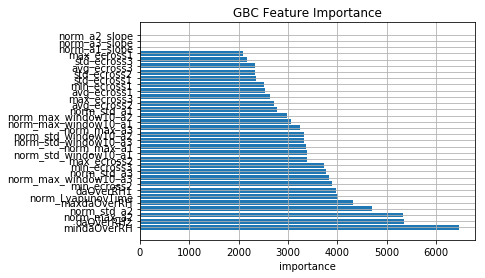

In [7]:
from pylab import *

points = vals_sorted

pos = arange(len(vals_sorted)) + .5 # centres the graph along y 

figure(1) # gives the figure a placeholder in memory
barh(pos, vals_sorted, align='center') 
yticks(pos, feature_names_sorted)
xlabel('importance')
title('GBC Feature Importance')
grid(True)
show()

In [8]:
import itertools

comb =  list(itertools.combinations(range(0, 10), 2)) # create the possible top 10 combinations

print comb

[(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (2, 3), (2, 4), (2, 5), (2, 6), (2, 7), (2, 8), (2, 9), (3, 4), (3, 5), (3, 6), (3, 7), (3, 8), (3, 9), (4, 5), (4, 6), (4, 7), (4, 8), (4, 9), (5, 6), (5, 7), (5, 8), (5, 9), (6, 7), (6, 8), (6, 9), (7, 8), (7, 9), (8, 9)]


In [9]:
%matplotlib nbagg    
%matplotlib notebook

# another method
from sklearn.ensemble.partial_dependence import partial_dependence
from mpl_toolkits.mplot3d import Axes3D

def D3_pdp(target_feature, model, X_train, names_list):
    fig = plt.figure()
    pdp, axes = partial_dependence(model, target_variables=target_feature, X=X_train, 
                                   grid_resolution=50, proba=True)
    XX, YY = np.meshgrid(axes[0], axes[1])
    Z = pdp[0].reshape(list(map(np.size, axes))).T

    ax = Axes3D(fig)
    
    surf = ax.plot_surface(XX, YY, Z, rstride=1, cstride=1, cmap=plt.cm.BuPu)
    ax.set_xlabel(feature_names_sorted[target_feature[0]])
    ax.set_ylabel(feature_names_sorted[target_feature[1]])
    ax.set_zlabel('Partial dependence')
    #  pretty init view
    ax.view_init(elev=22, azim=122)
    plt.colorbar(surf)
    plt.suptitle('Partial dependence of stability on {0} and {1} '.format(names_list[target_feature[0]], names_list[target_feature[1]]))
    plt.subplots_adjust(top=0.9)

    plt.show()

<IPython.core.display.Javascript object>


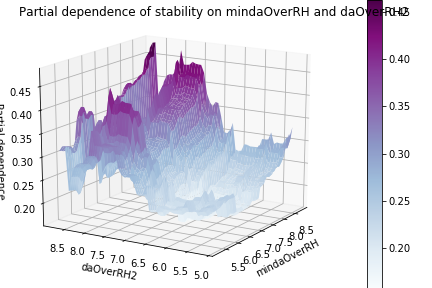

<IPython.core.display.Javascript object>


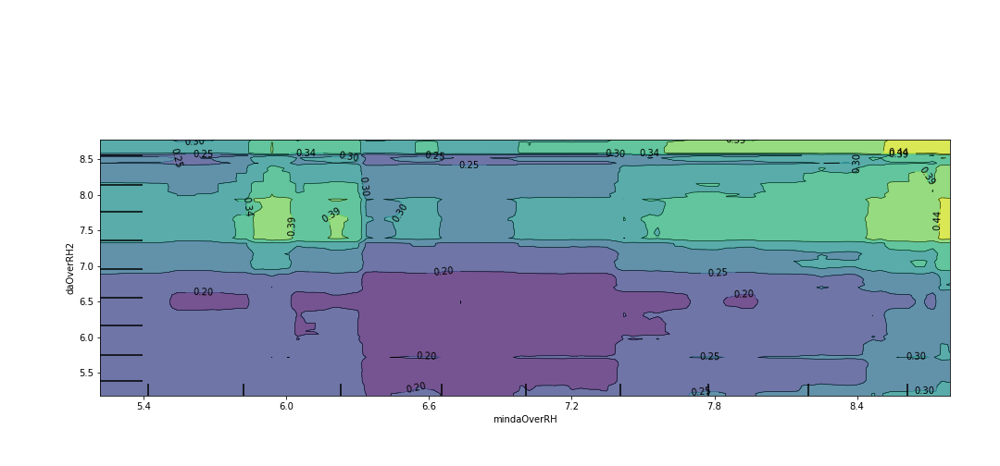

<IPython.core.display.Javascript object>


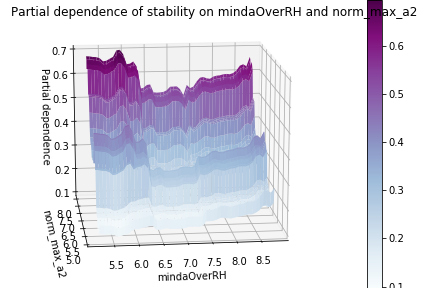

<IPython.core.display.Javascript object>


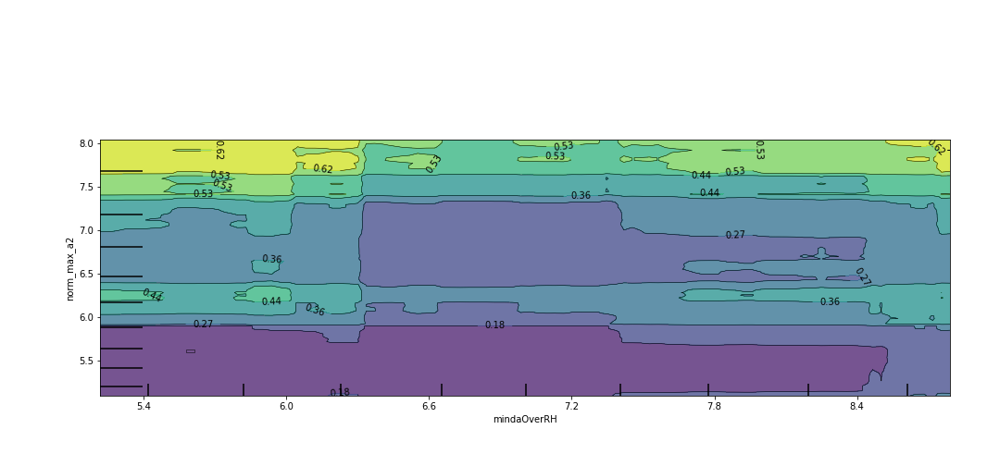

<IPython.core.display.Javascript object>


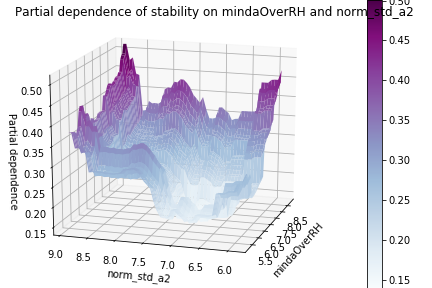

<IPython.core.display.Javascript object>


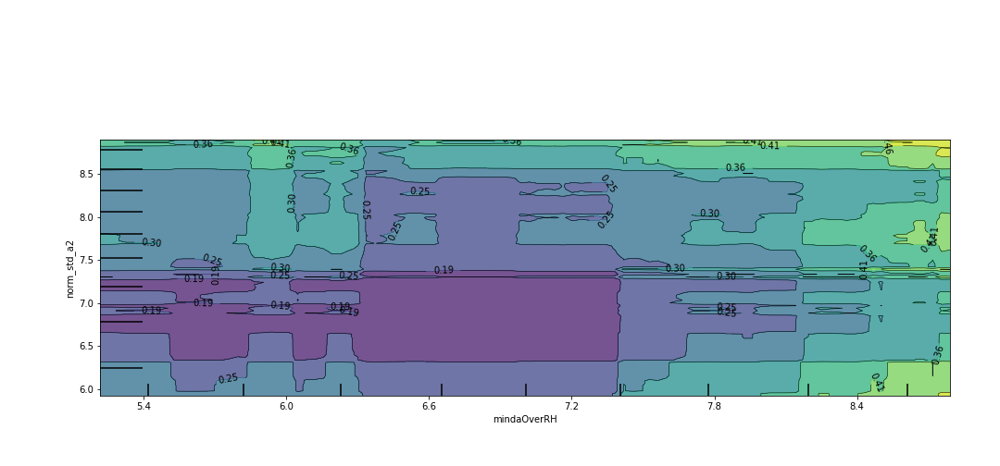

<IPython.core.display.Javascript object>


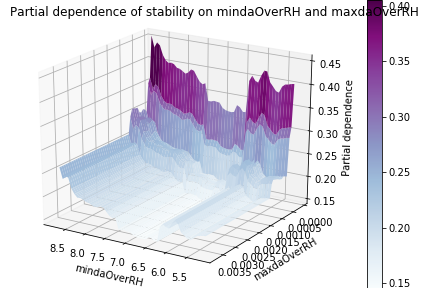

<IPython.core.display.Javascript object>


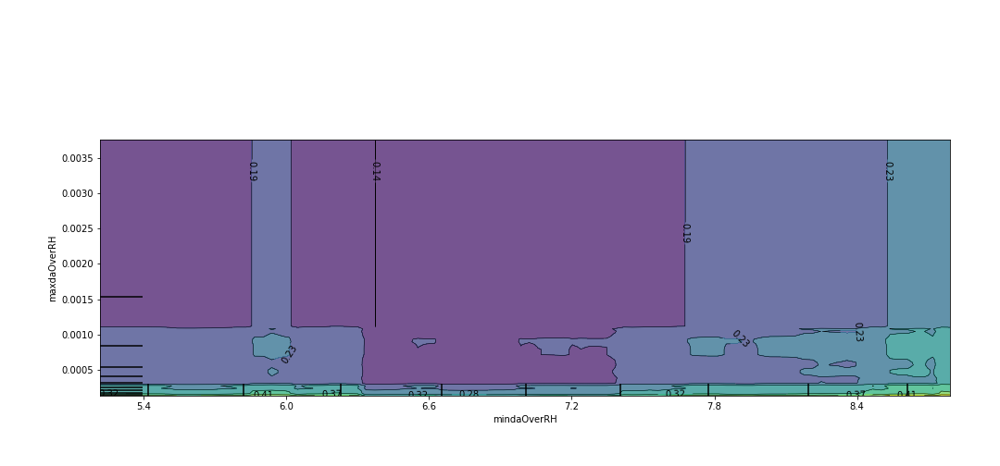

<IPython.core.display.Javascript object>


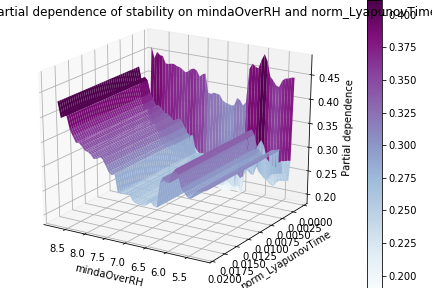

<IPython.core.display.Javascript object>


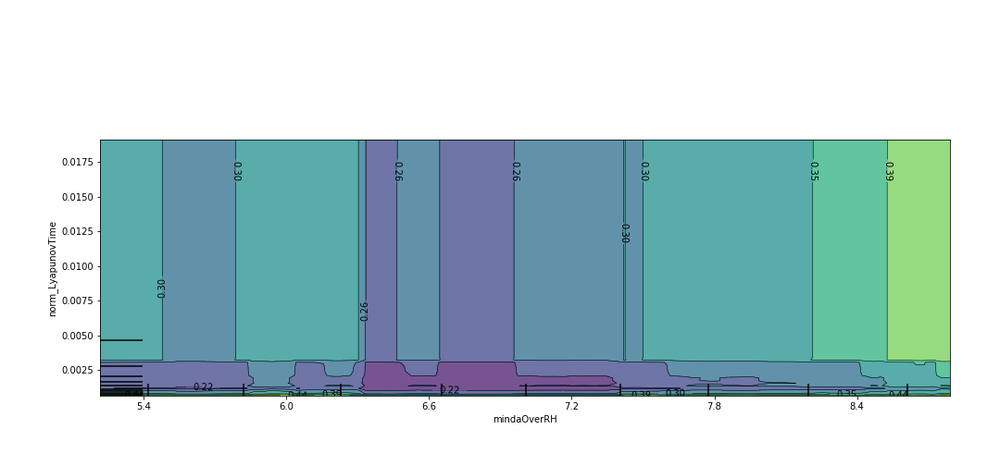

<IPython.core.display.Javascript object>


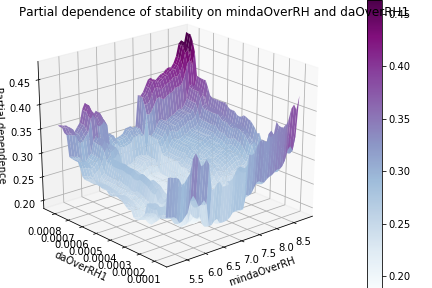

<IPython.core.display.Javascript object>


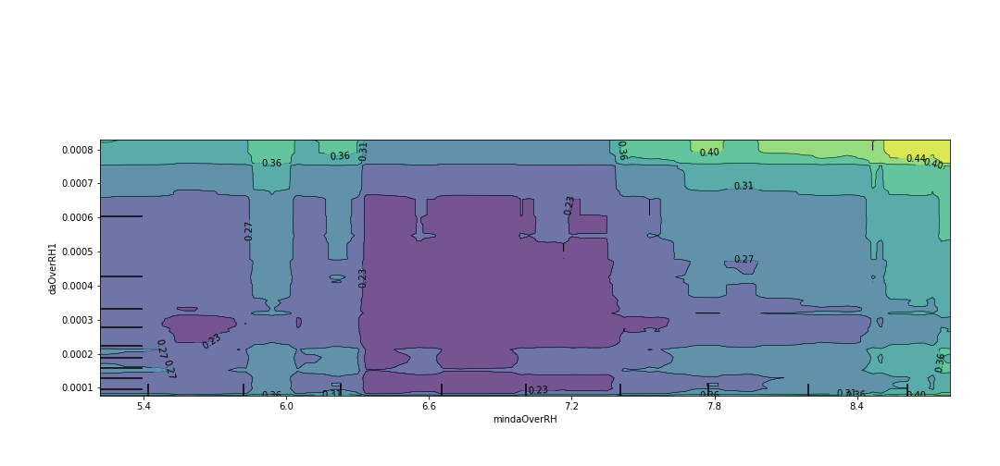

<IPython.core.display.Javascript object>


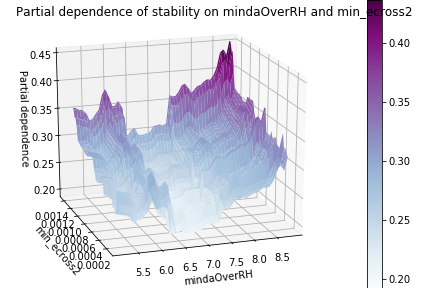

<IPython.core.display.Javascript object>


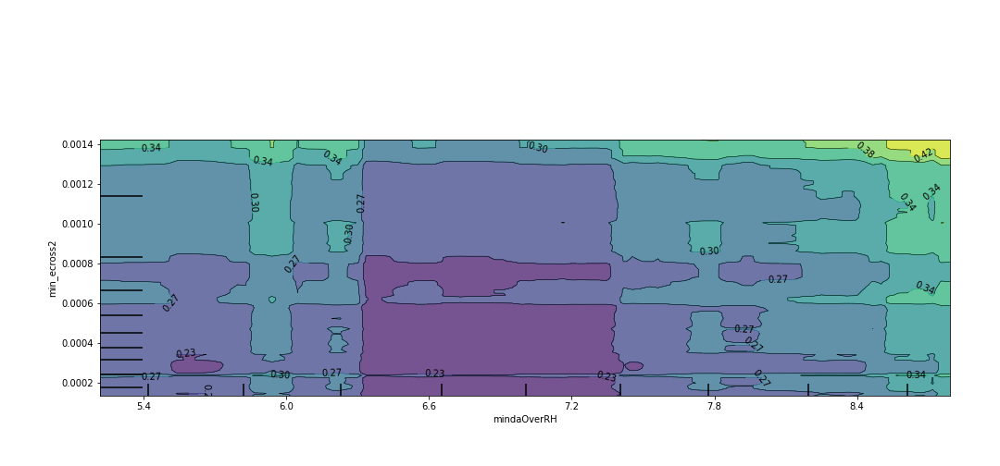

<IPython.core.display.Javascript object>


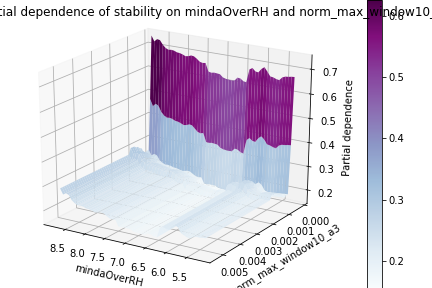

<IPython.core.display.Javascript object>


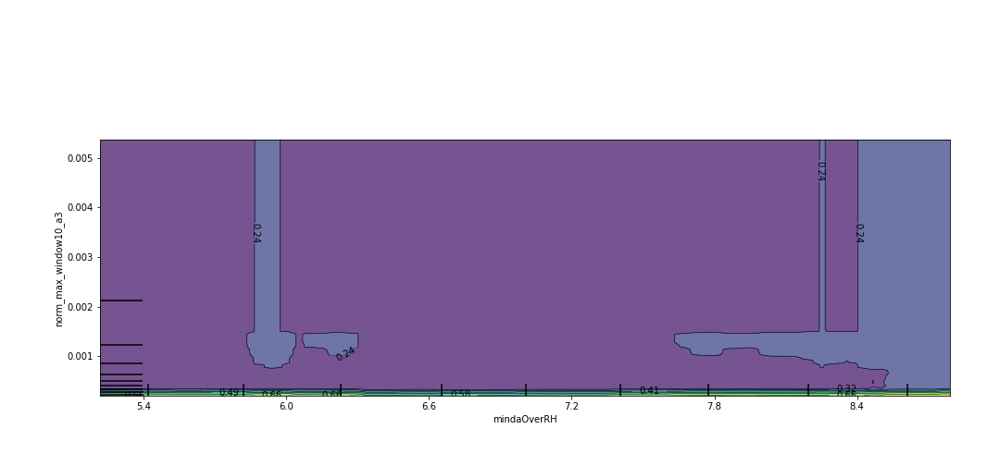

<IPython.core.display.Javascript object>


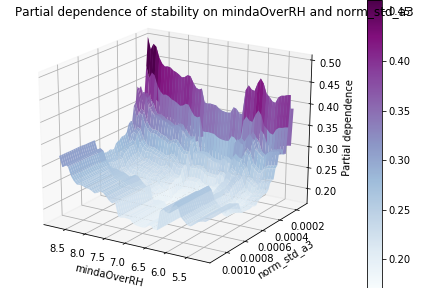

<IPython.core.display.Javascript object>


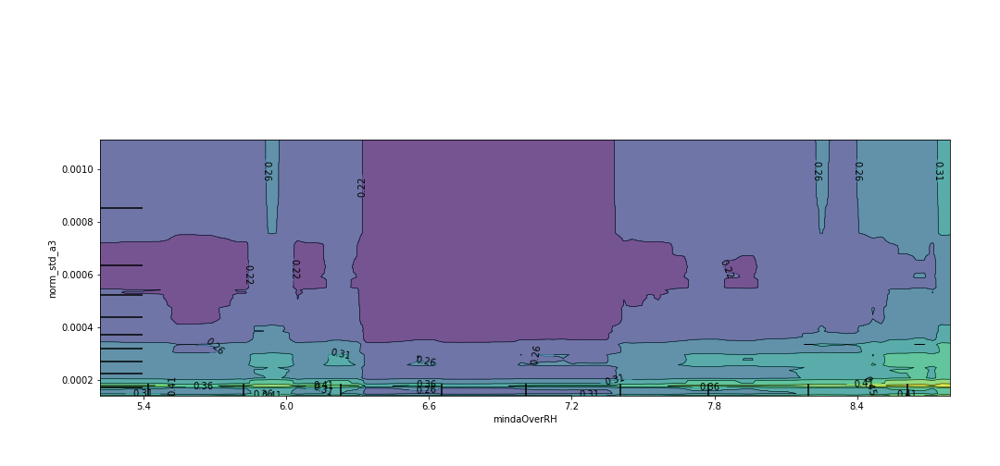

<IPython.core.display.Javascript object>


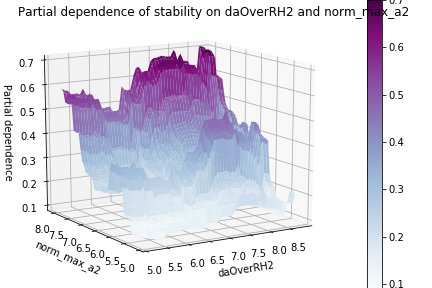

<IPython.core.display.Javascript object>


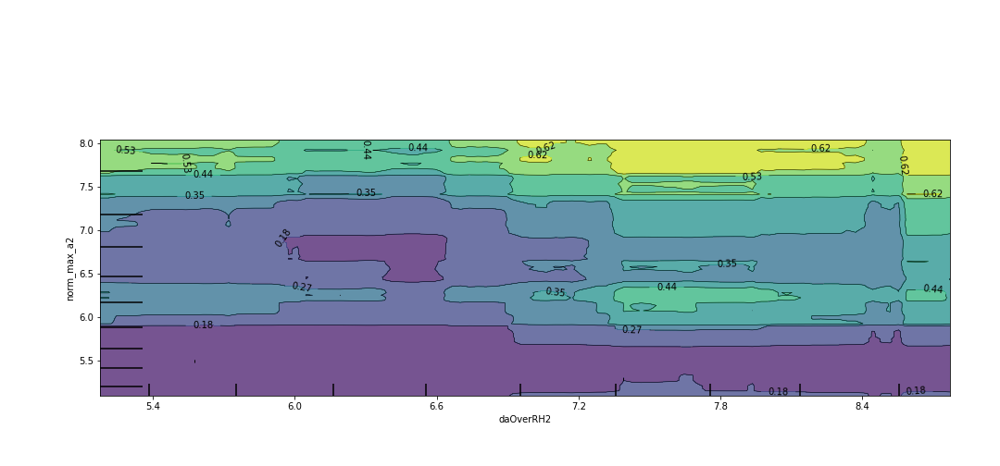

/home/tom/anaconda2/envs/py27/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


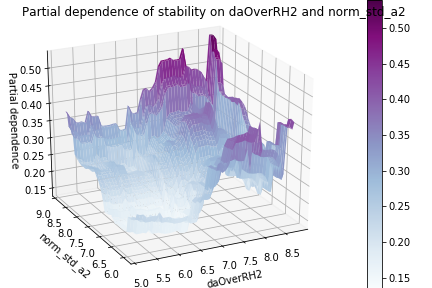

<IPython.core.display.Javascript object>


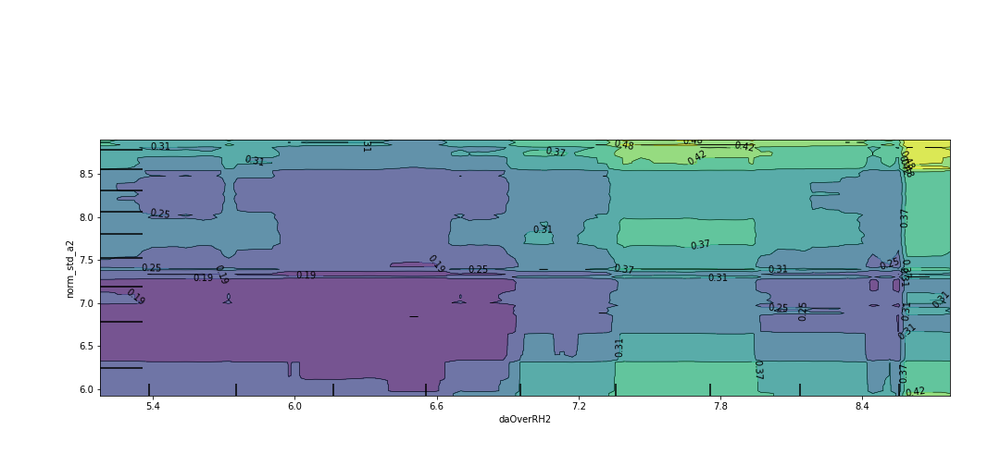

<IPython.core.display.Javascript object>


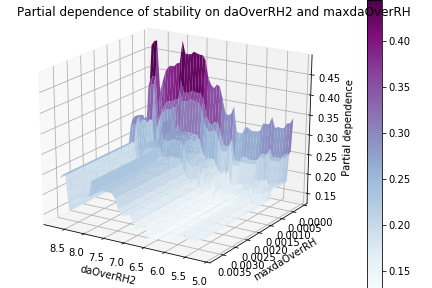

<IPython.core.display.Javascript object>


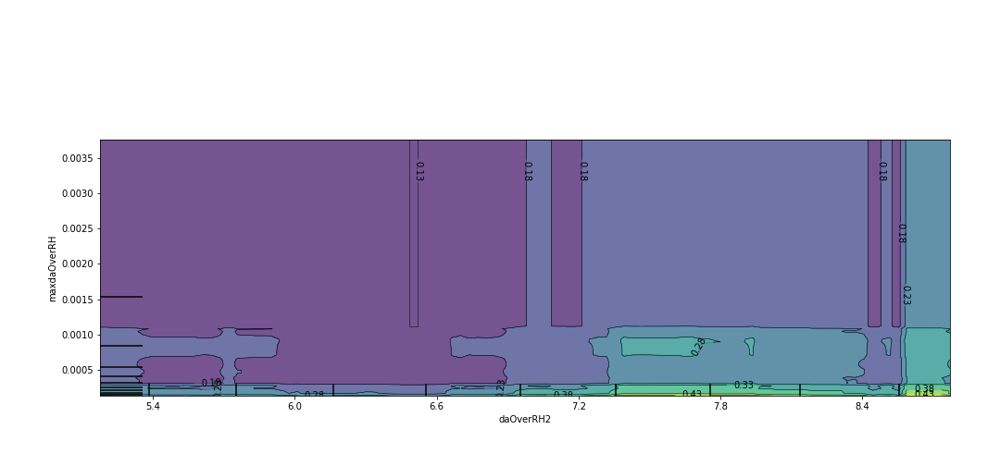

<IPython.core.display.Javascript object>


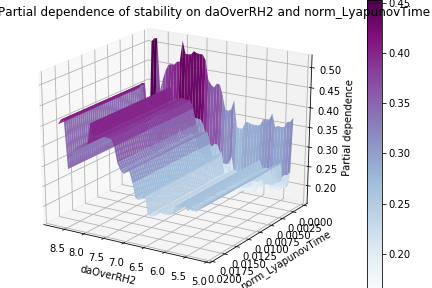

<IPython.core.display.Javascript object>


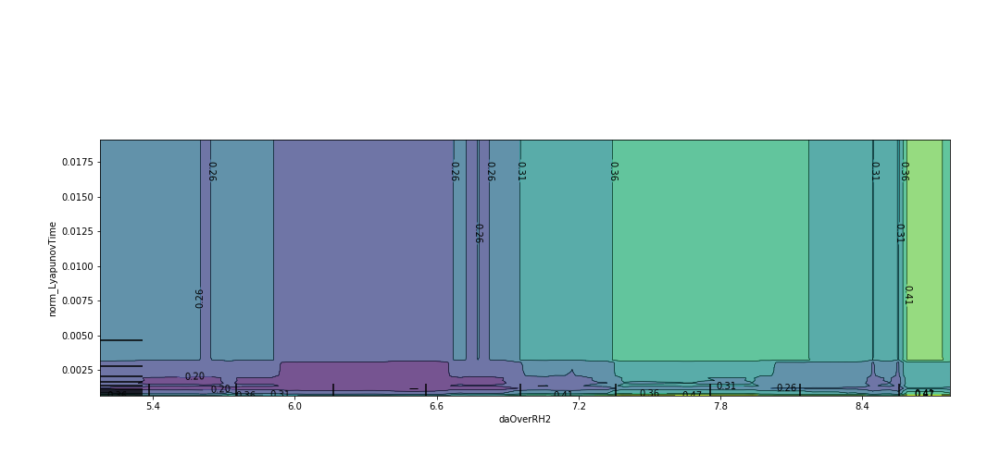

<IPython.core.display.Javascript object>


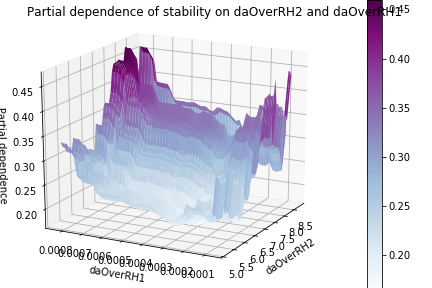

<IPython.core.display.Javascript object>


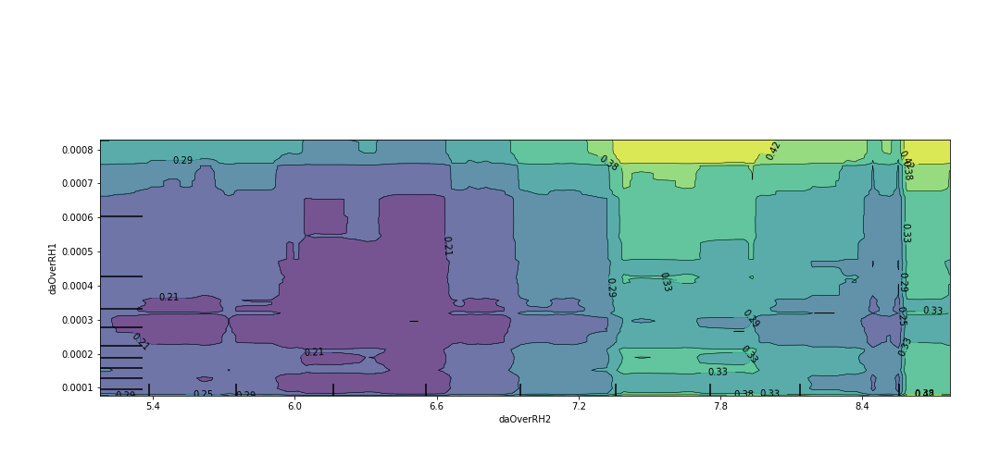

<IPython.core.display.Javascript object>


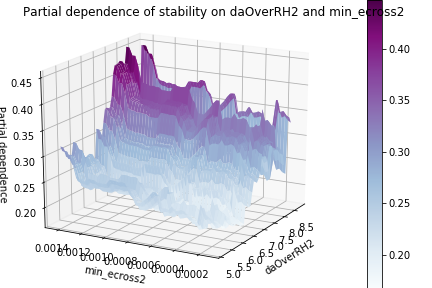

<IPython.core.display.Javascript object>


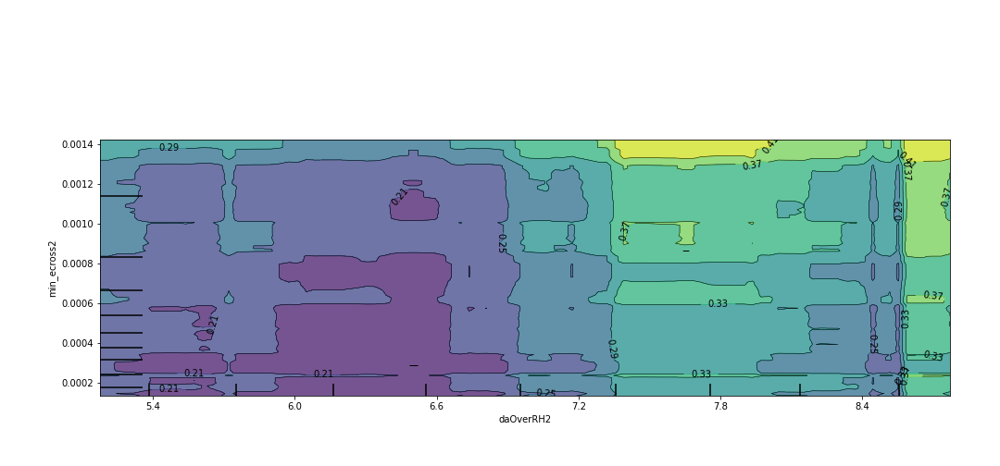

<IPython.core.display.Javascript object>


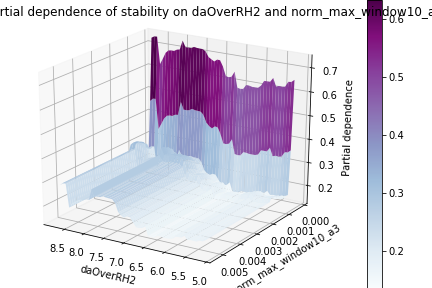

<IPython.core.display.Javascript object>


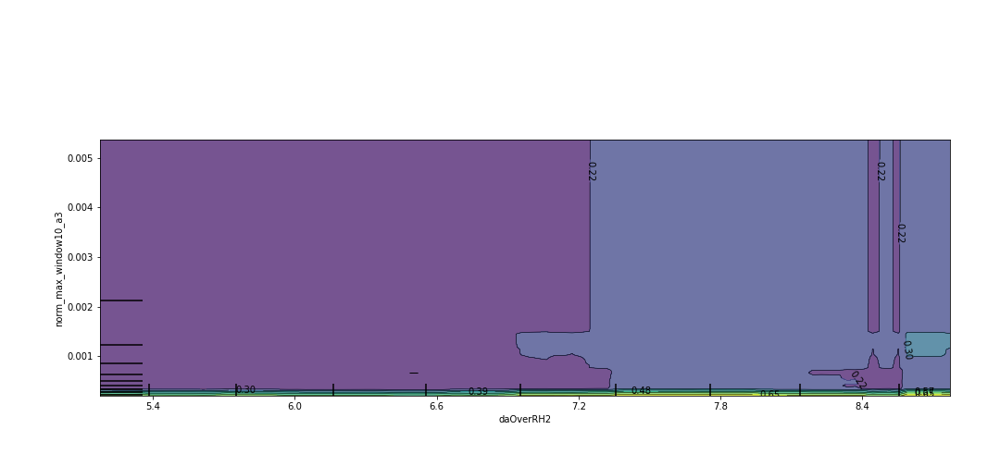

<IPython.core.display.Javascript object>


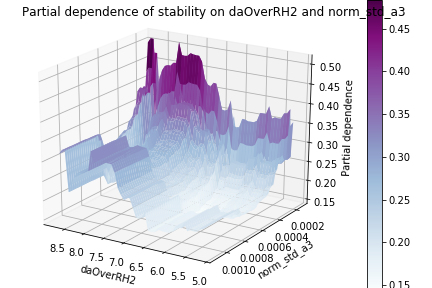

<IPython.core.display.Javascript object>


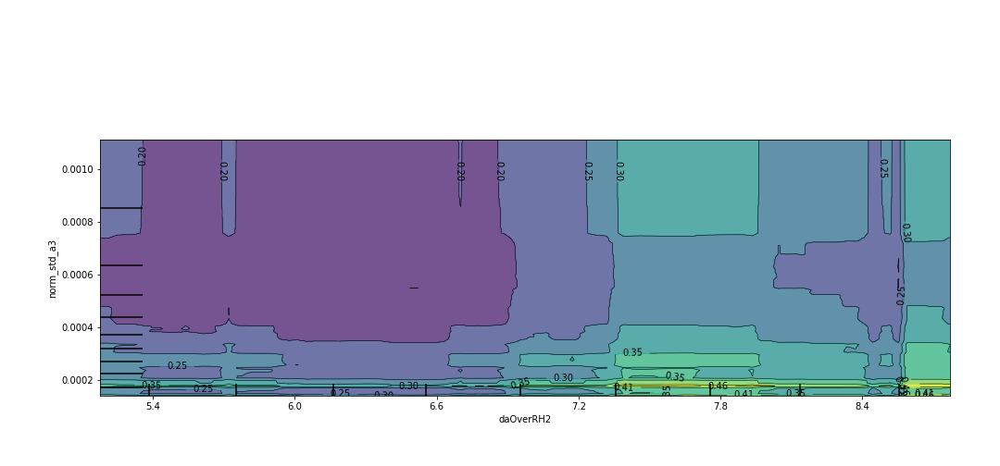

<IPython.core.display.Javascript object>


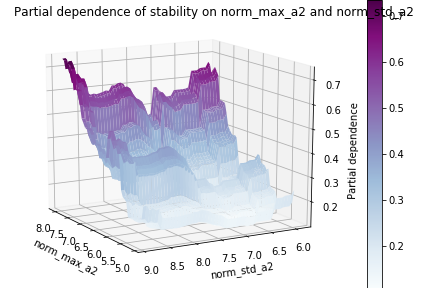

<IPython.core.display.Javascript object>


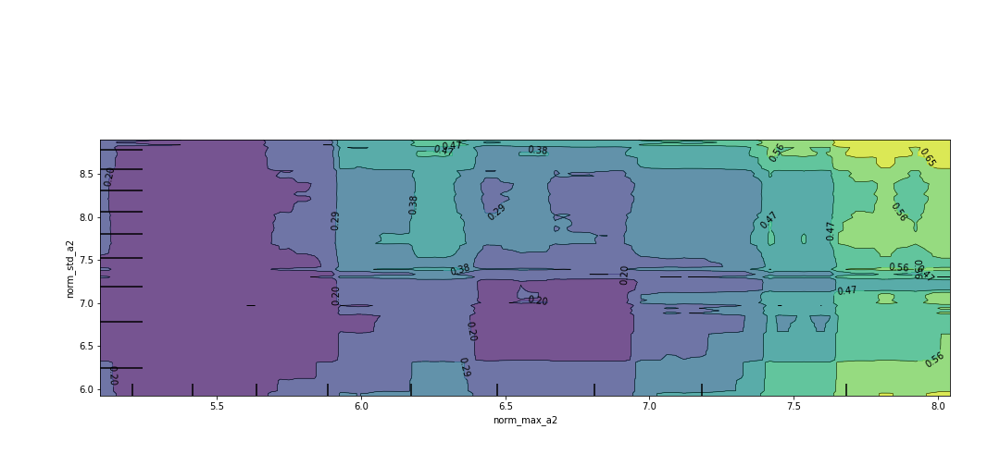

<IPython.core.display.Javascript object>


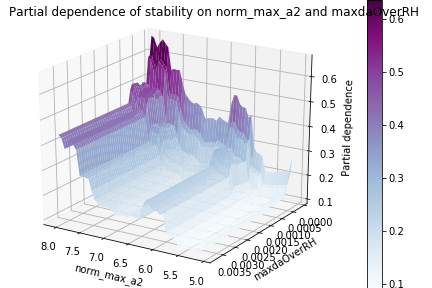

<IPython.core.display.Javascript object>


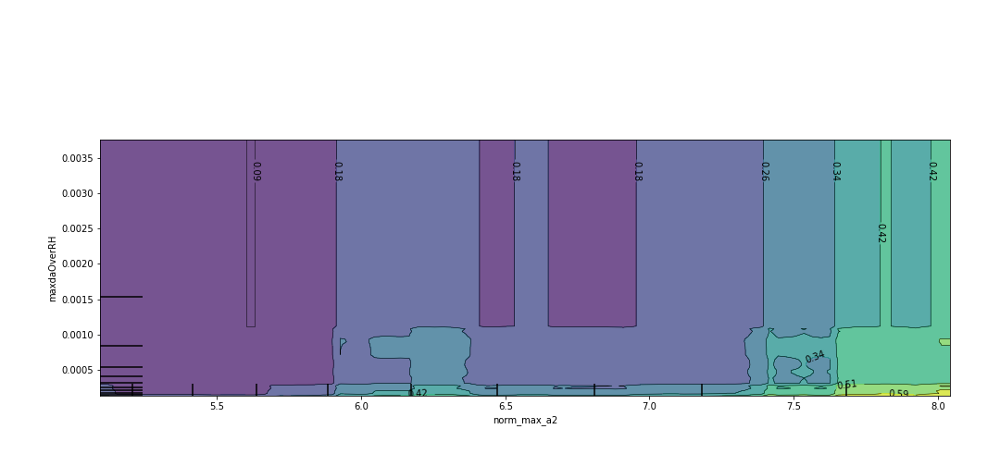

<IPython.core.display.Javascript object>


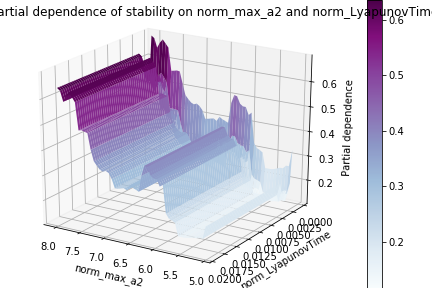

<IPython.core.display.Javascript object>


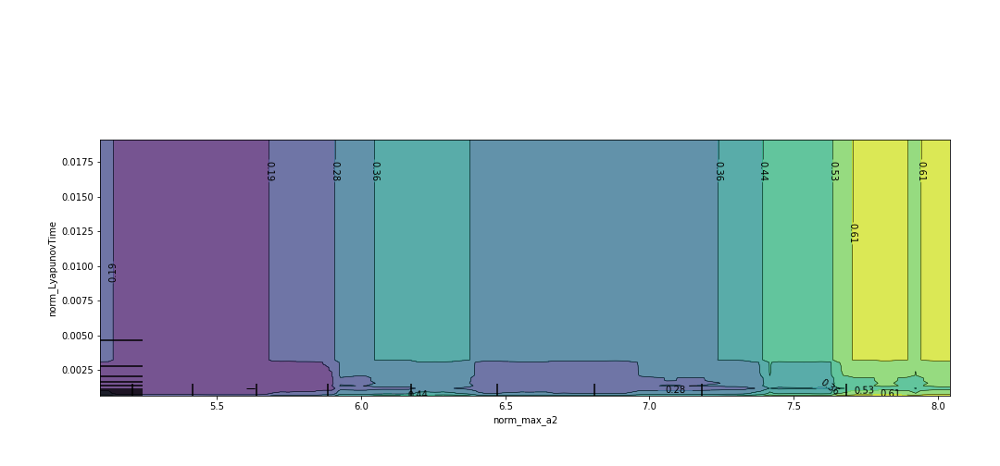

<IPython.core.display.Javascript object>


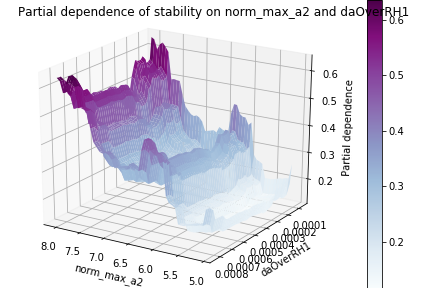

<IPython.core.display.Javascript object>


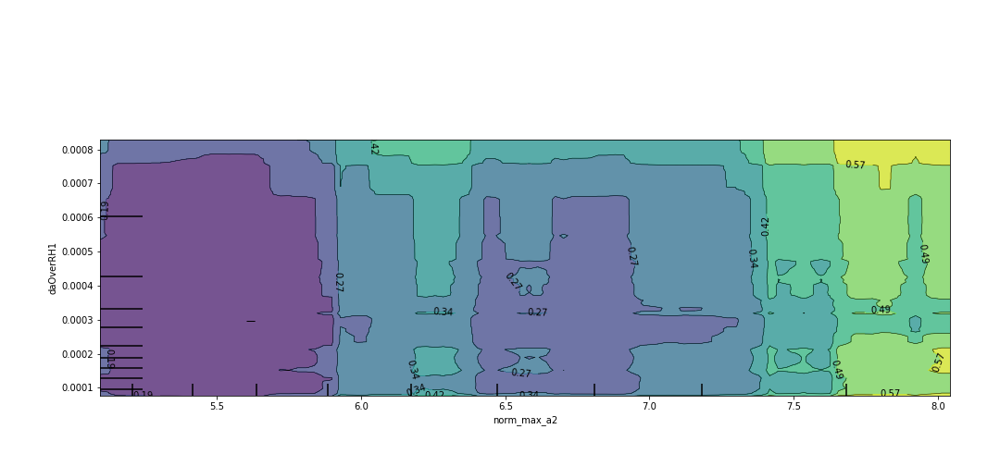

<IPython.core.display.Javascript object>


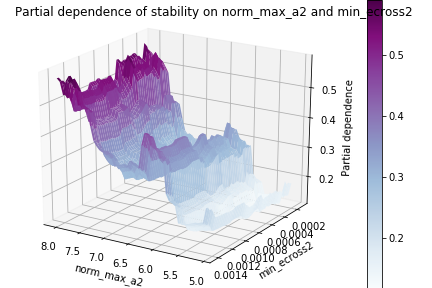

<IPython.core.display.Javascript object>


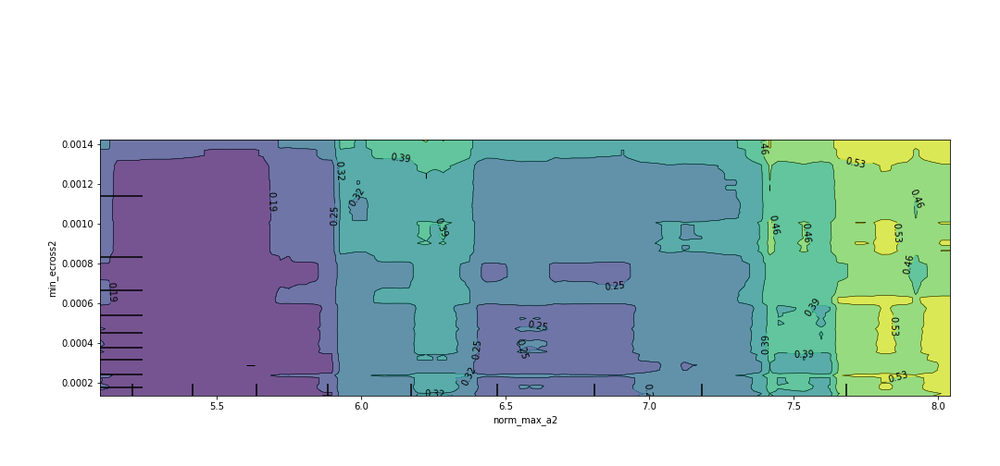

<IPython.core.display.Javascript object>


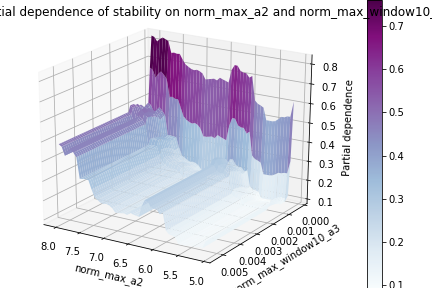

<IPython.core.display.Javascript object>


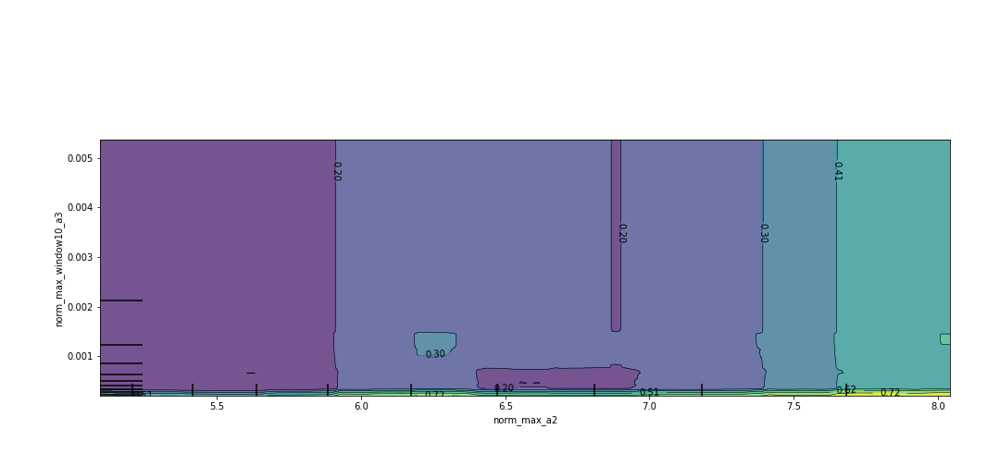

<IPython.core.display.Javascript object>


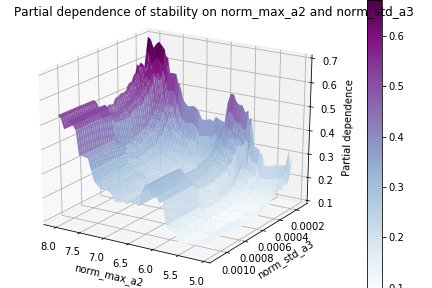

<IPython.core.display.Javascript object>


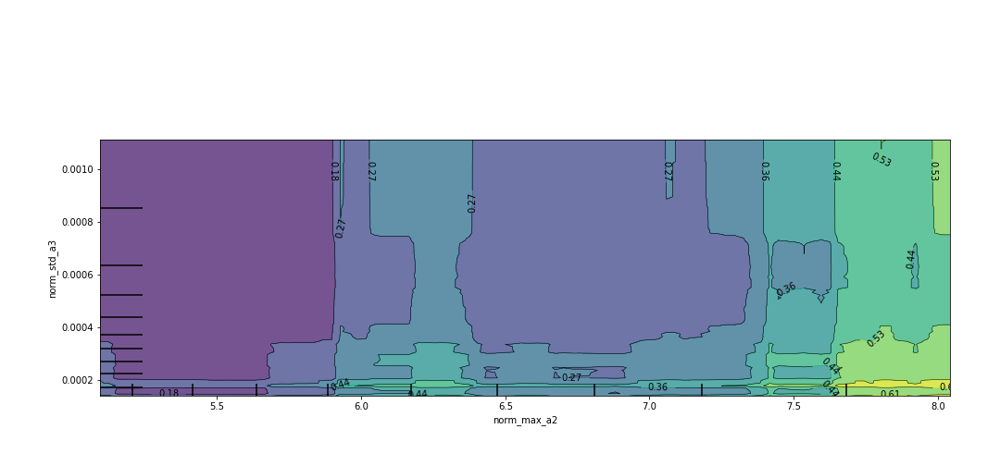

<IPython.core.display.Javascript object>


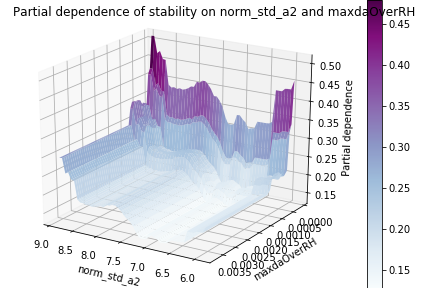

<IPython.core.display.Javascript object>


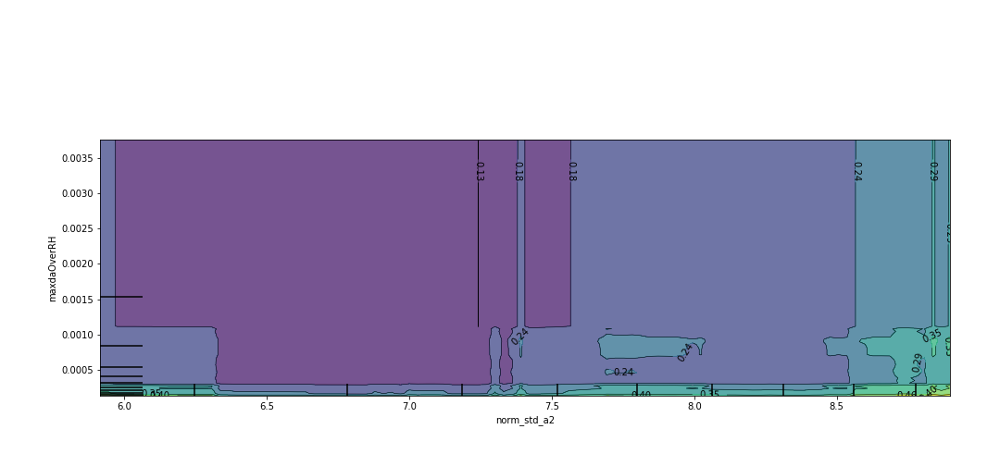

<IPython.core.display.Javascript object>


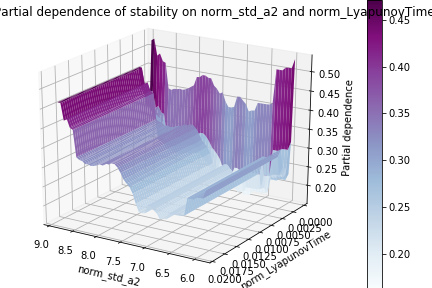

<IPython.core.display.Javascript object>


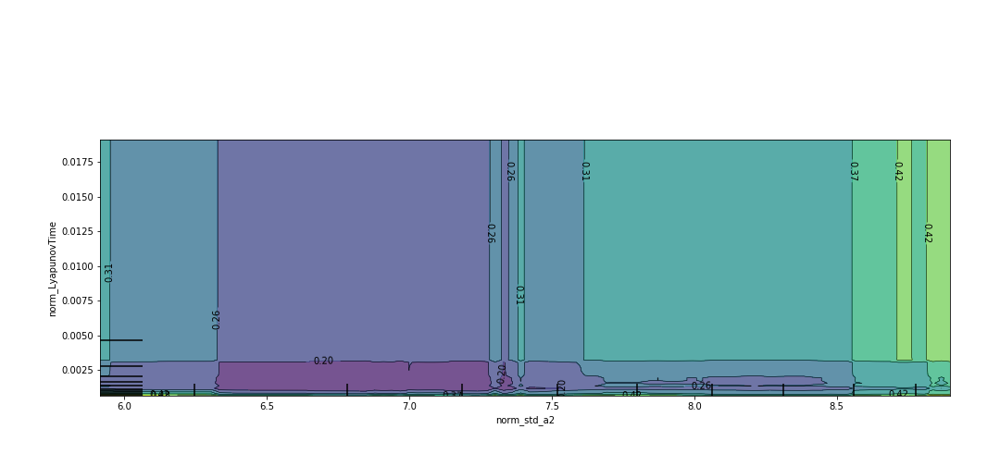

<IPython.core.display.Javascript object>


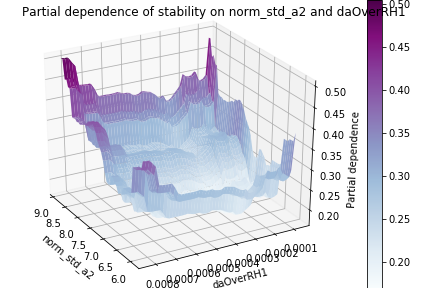

<IPython.core.display.Javascript object>


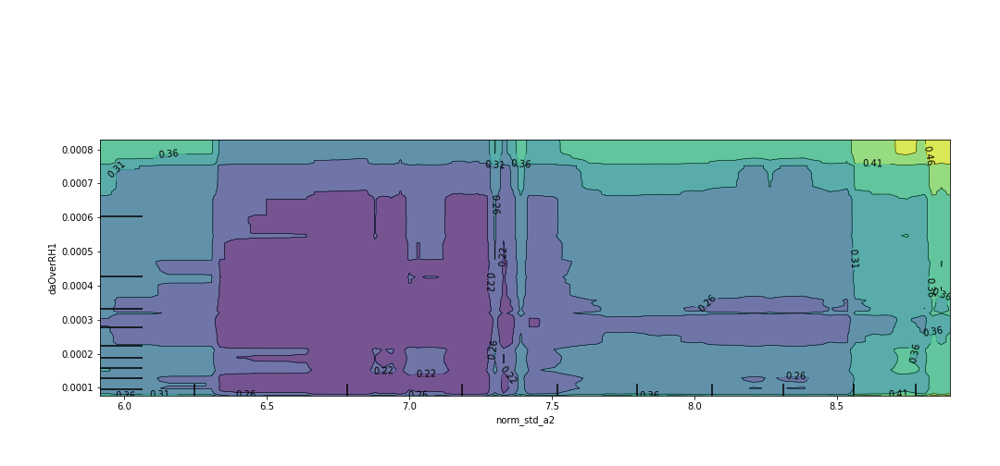

<IPython.core.display.Javascript object>


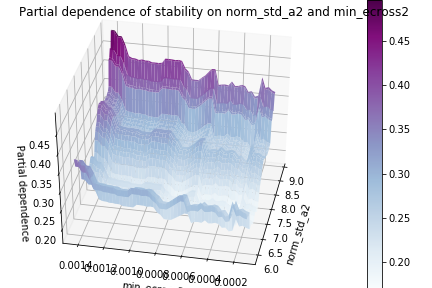

<IPython.core.display.Javascript object>


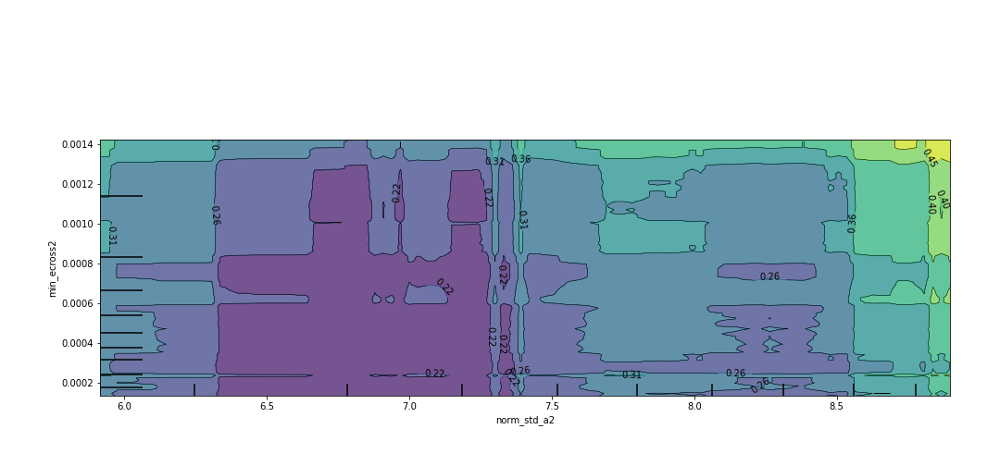

<IPython.core.display.Javascript object>


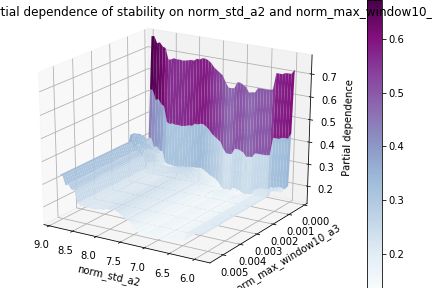

<IPython.core.display.Javascript object>


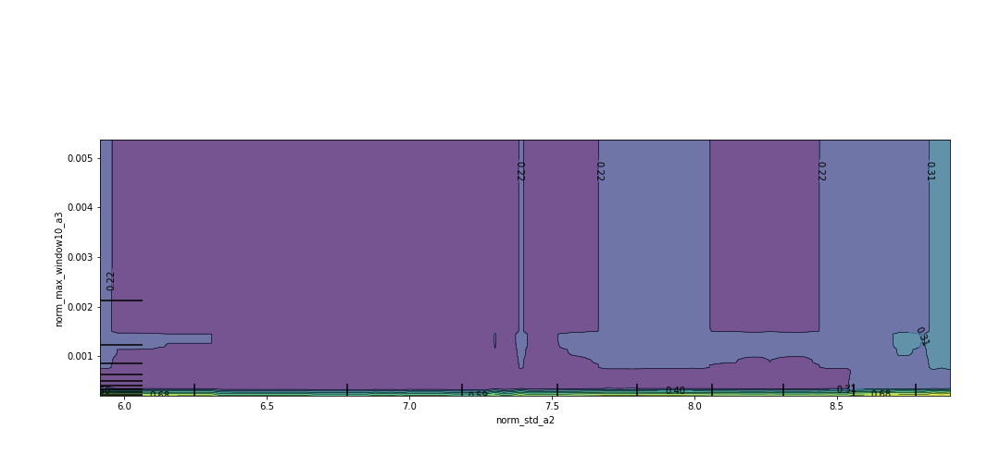

<IPython.core.display.Javascript object>


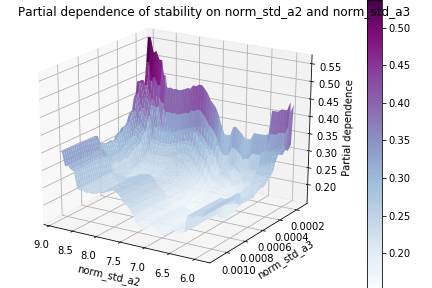

<IPython.core.display.Javascript object>


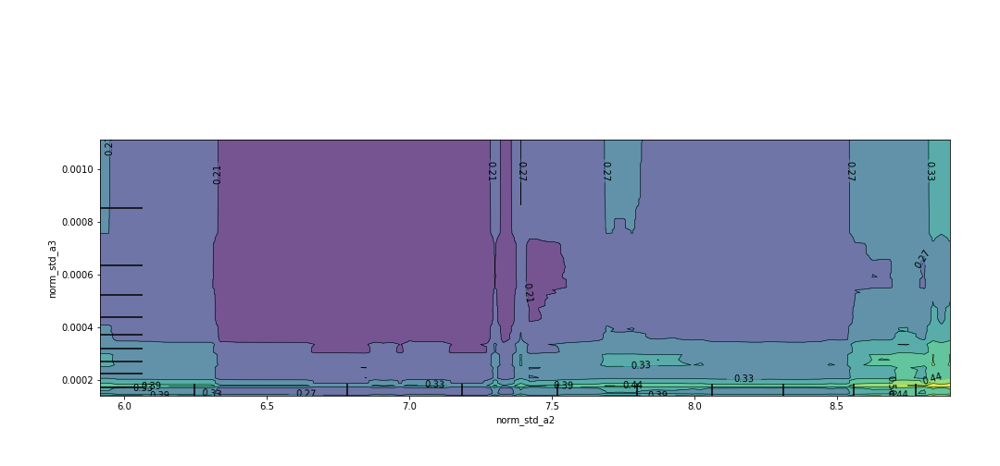

<IPython.core.display.Javascript object>


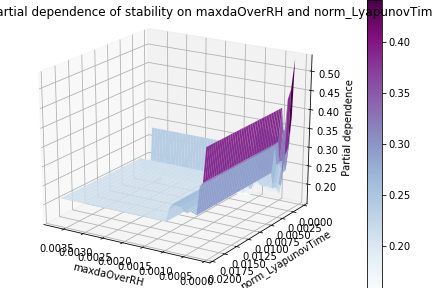

<IPython.core.display.Javascript object>


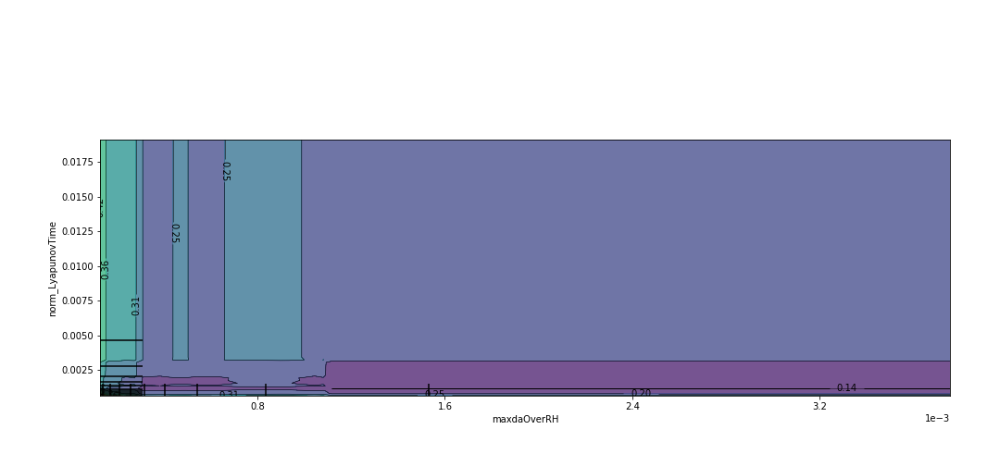

<IPython.core.display.Javascript object>


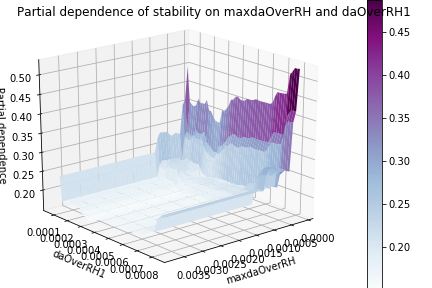

<IPython.core.display.Javascript object>


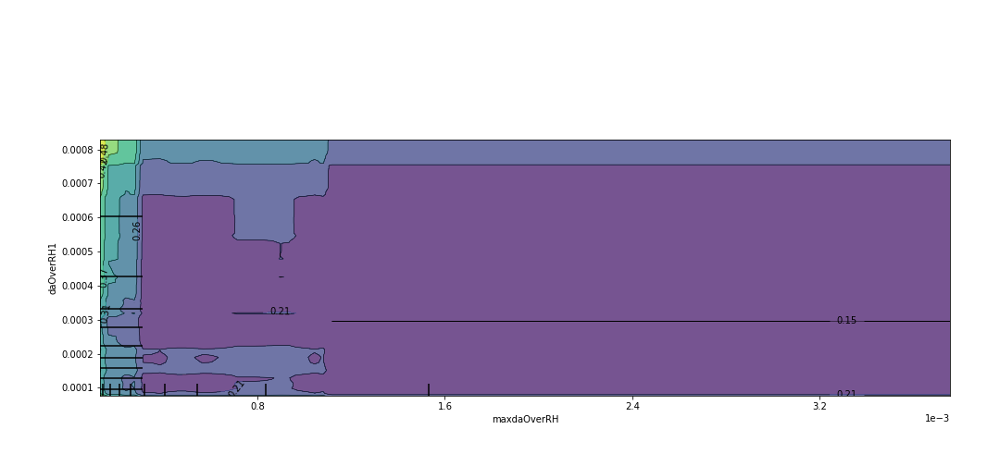

<IPython.core.display.Javascript object>


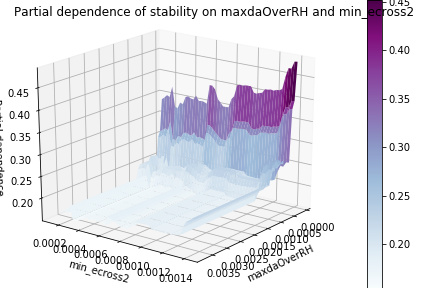

<IPython.core.display.Javascript object>


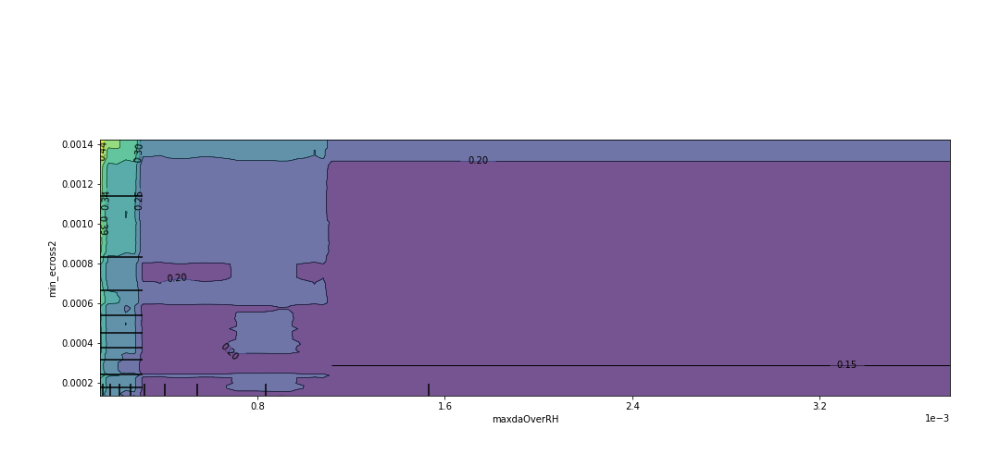

<IPython.core.display.Javascript object>


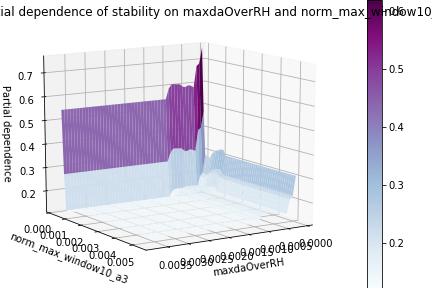

<IPython.core.display.Javascript object>


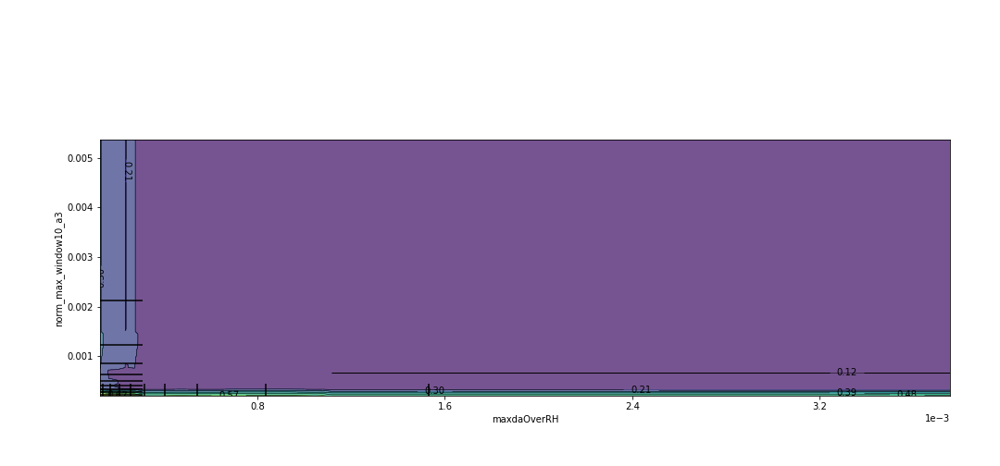

<IPython.core.display.Javascript object>


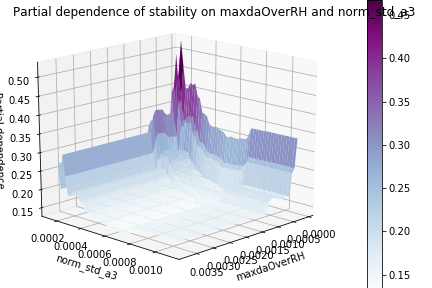

<IPython.core.display.Javascript object>


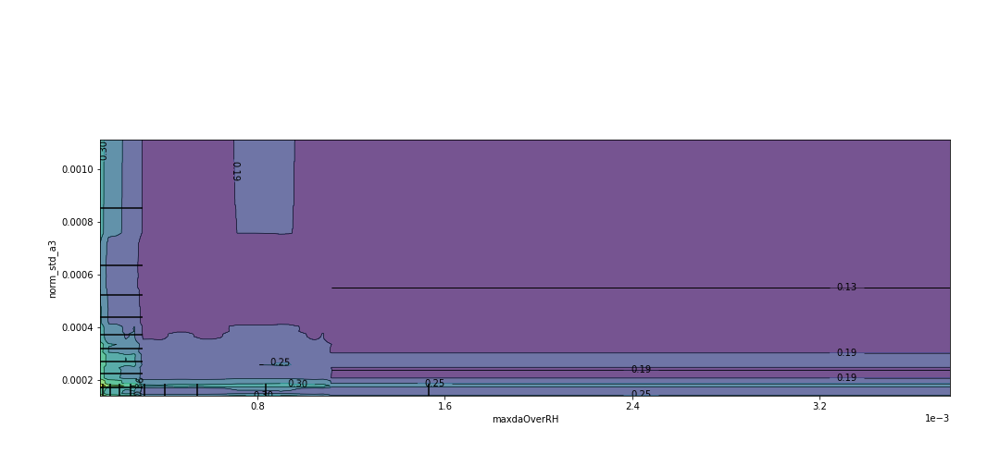

<IPython.core.display.Javascript object>


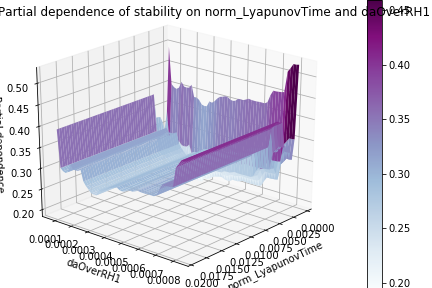

<IPython.core.display.Javascript object>


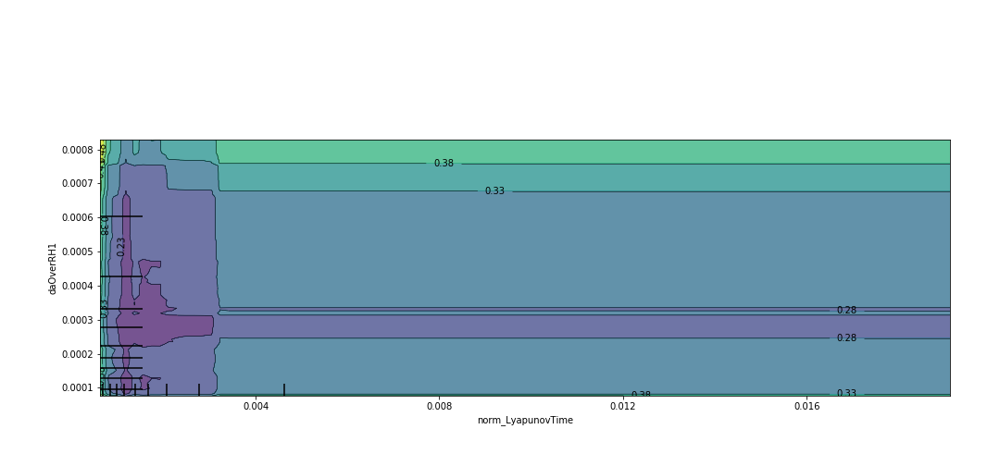

<IPython.core.display.Javascript object>


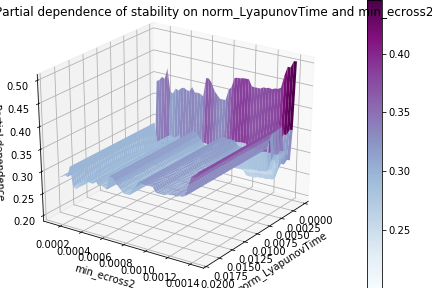

<IPython.core.display.Javascript object>


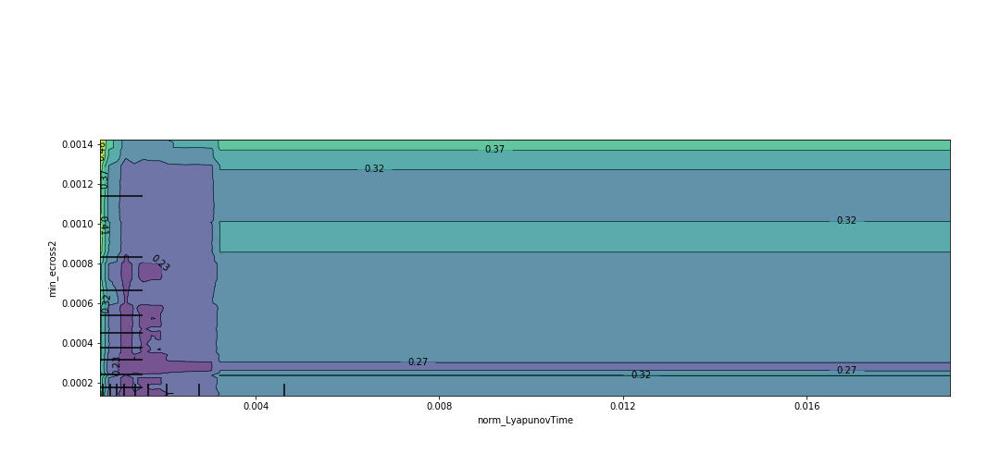

<IPython.core.display.Javascript object>


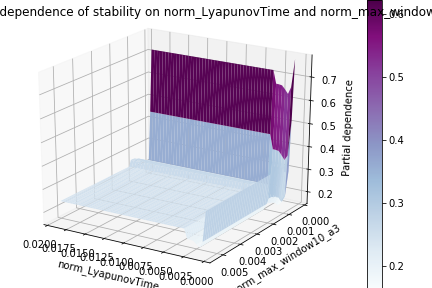

<IPython.core.display.Javascript object>


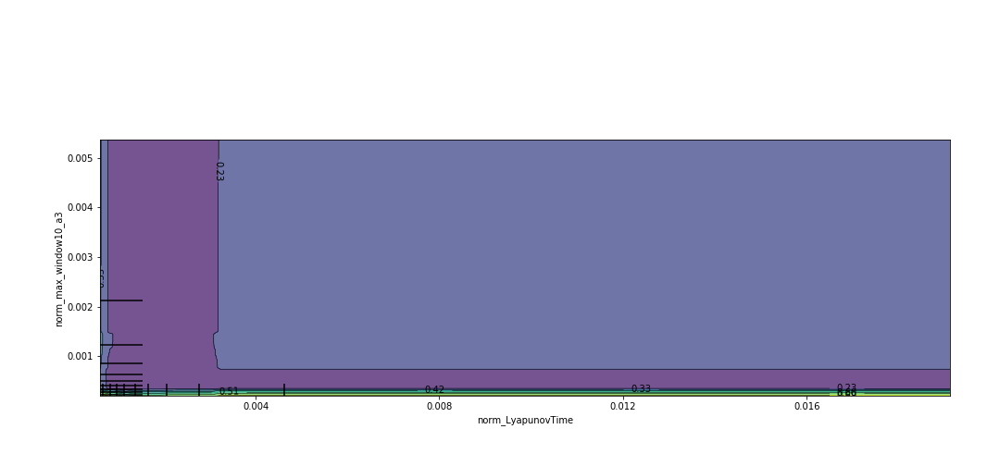

<IPython.core.display.Javascript object>


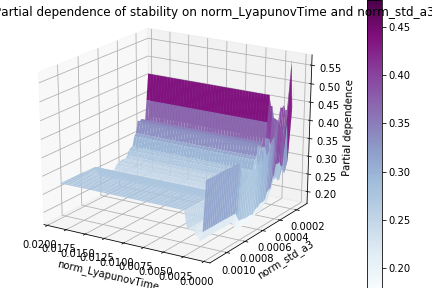

<IPython.core.display.Javascript object>


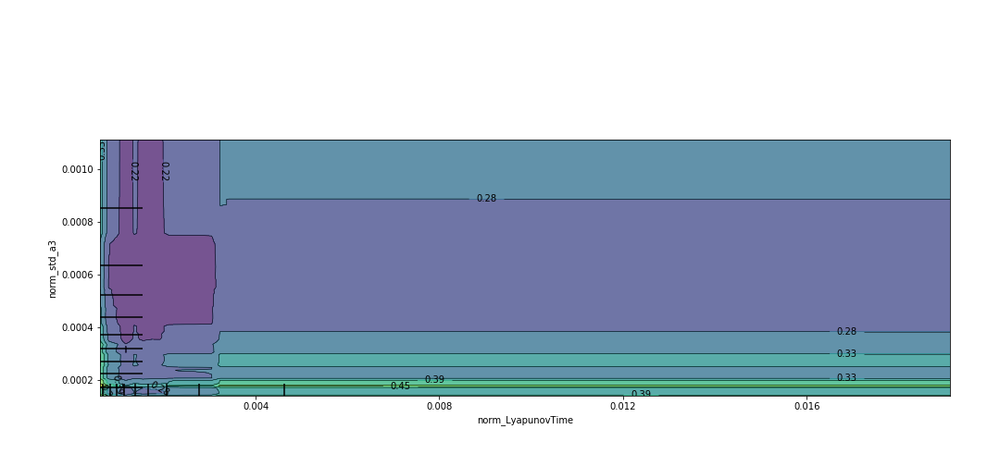

<IPython.core.display.Javascript object>


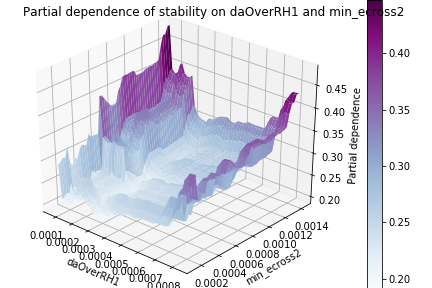

<IPython.core.display.Javascript object>


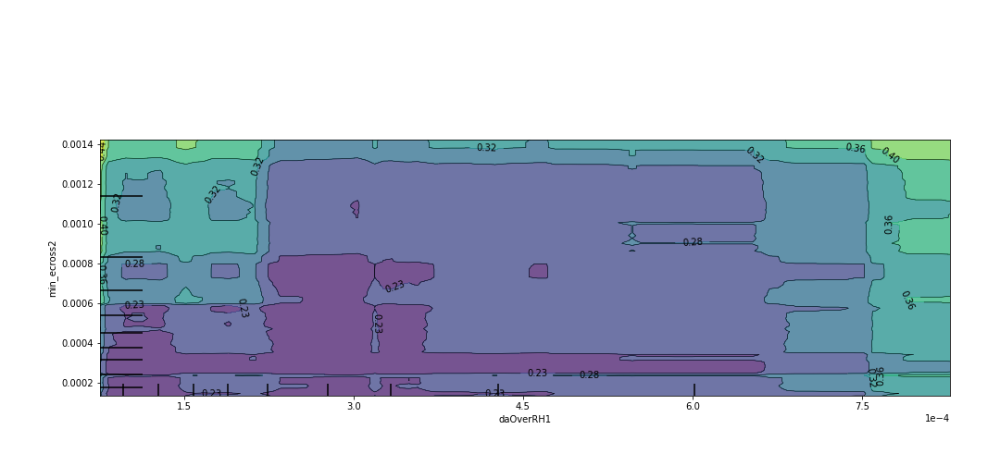

<IPython.core.display.Javascript object>


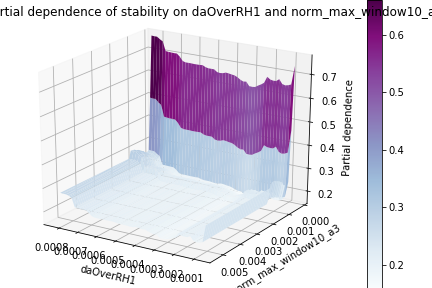

<IPython.core.display.Javascript object>


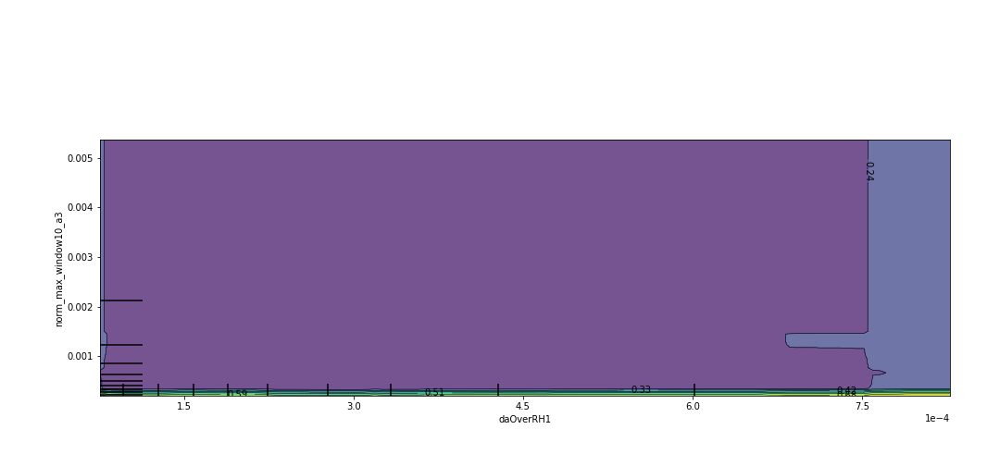

<IPython.core.display.Javascript object>


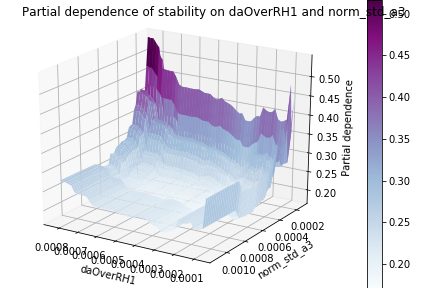

<IPython.core.display.Javascript object>


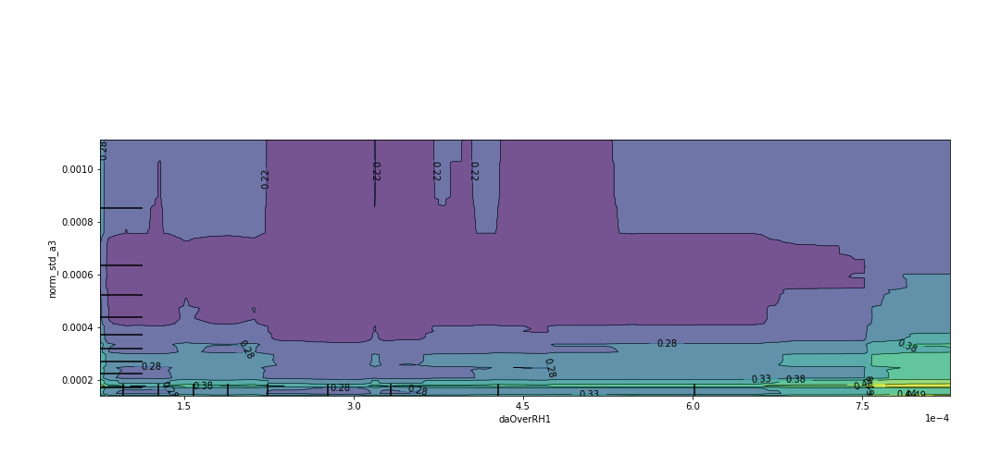

<IPython.core.display.Javascript object>


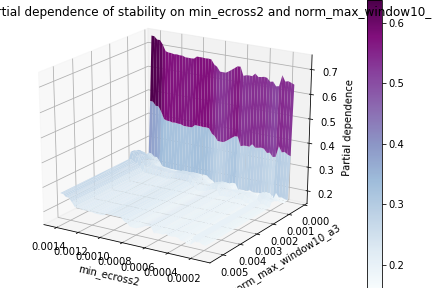

<IPython.core.display.Javascript object>


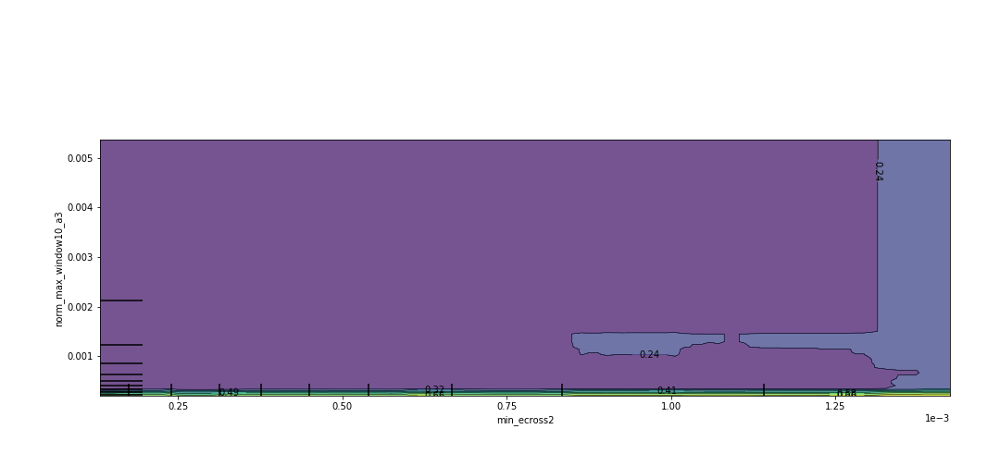

<IPython.core.display.Javascript object>


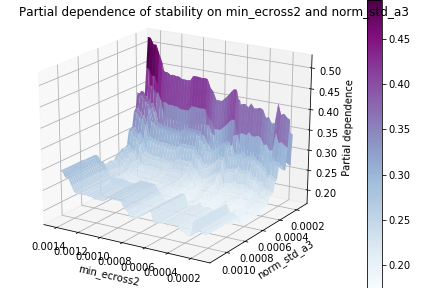

<IPython.core.display.Javascript object>


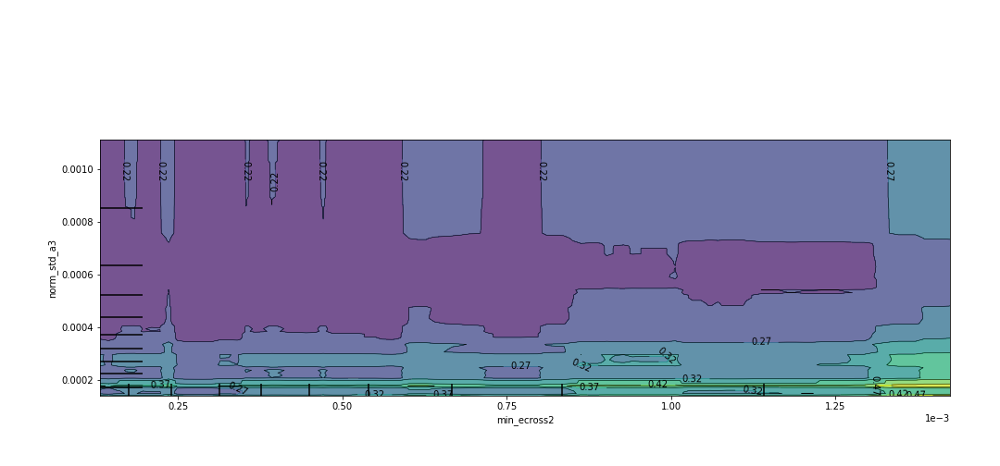

<IPython.core.display.Javascript object>


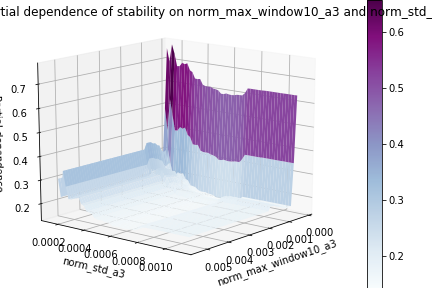

<IPython.core.display.Javascript object>


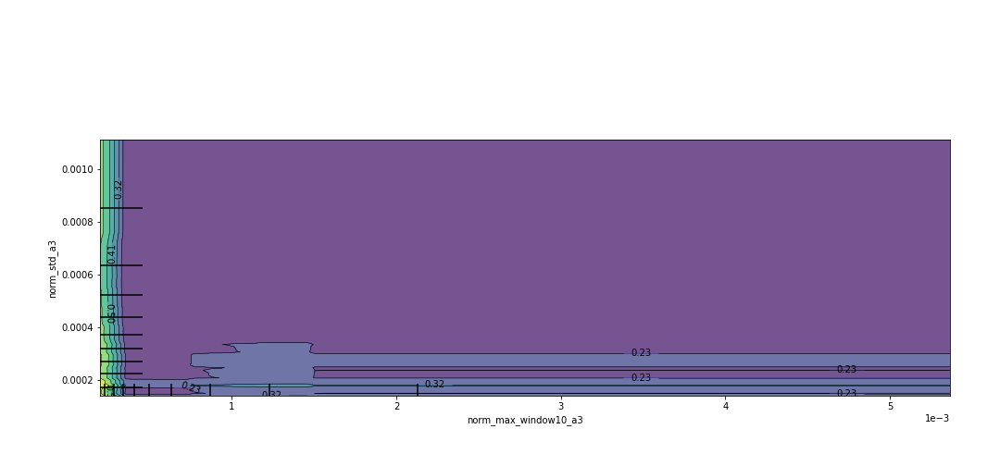

In [10]:
from sklearn.ensemble.partial_dependence import plot_partial_dependence # the proba argument has been added to the PPD function

for pairs in comb:
    names = feature_names_sorted
    
    D3_pdp(pairs, model, X_train, feature_names_sorted)
    
    fig, axs = plot_partial_dependence(model, X_train, [pairs],
                                       feature_names=feature_names_sorted,
                                       grid_resolution=100, figsize=(15,7), proba=True)
    
    
    
   
    plt.show()
    
    